# 导入包
numpy 向量和矩阵运算，matplotlib 画图，time 统计程序运行时间， os 返回操作系统的一些信息

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import time
import os
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

# 输入数据
components钢的成分, coolsection_length 连铸机二冷区各个区段的长度，h_coolsection 连铸二冷区的换热系数，measured_value 测量温度值，measured_location 测量温度的位置

In [2]:
def read_input_sourcedata():
    components, h_coolsection, coolsection_length, measured_value, measured_location = [], [], [], [], []
    input_parameters_path = os.getcwd() 
    with open(input_parameters_path + "/major_components_steel.csv","r") as f:
        for line in f.readlines():
            [key, value] = line.strip().split(',')
            components.append([key, float(value)])
    
    with open(input_parameters_path + "/continuous_caster.csv","r") as f:
        for line in f.readlines():
            [length, h] = line.strip().split(',')
            h_coolsection.append(float(h))
            coolsection_length.append(float(length))
    h_coolsection = h_coolsection[1:]
    h_coolsection = np.array(h_coolsection)  
    h_coolsection = h_coolsection.reshape(h_coolsection.shape[0], 1)    
    
    with open(input_parameters_path + "/measured_temperature.csv","r") as f:
        for line in f.readlines():
            [location, value] = line.strip().split(',')
            measured_location.append(float(location))
            measured_value.append(float(value))
    measured_temperature = {"location":np.array(measured_location), "value": np.array(measured_value)}
    
    return dict(components), coolsection_length, h_coolsection, measured_temperature

def plot_input_data():
    x = [i for i in range(len(components.values()))]
    plt.bar(x, components.values(), width = 0.4)
    plt.ylabel('components(%)')
    plt.xticks(x, components.keys())
    plt.show()
    print("steel components: ",components)
    
    x = [i for i in range(len(coolsection_length))]
    plt.bar(x, coolsection_length, width = 0.4)
    plt.ylabel('length of SCZ(m)')
    plt.show()
    print("length of cool sections: ", coolsection_length)
    
    x = [i for i in range(len(measured_temperature['value']))]
    plt.bar(x, measured_temperature['value'], width = 0.4)
    plt.ylabel('Measured temperature')
    plt.show()

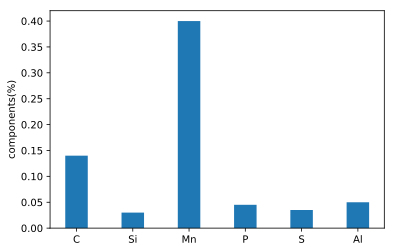

steel components:  {'C': 0.14, 'Si': 0.03, 'Mn': 0.4, 'P': 0.045, 'S': 0.035, 'Al': 0.05}


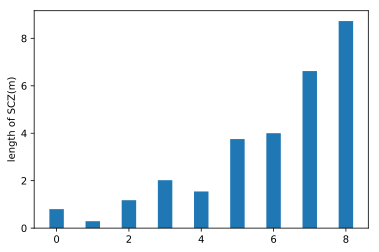

length of cool sections:  [0.8, 0.292, 1.177, 2.02, 1.545, 3.755, 4.002, 6.621, 8.729]


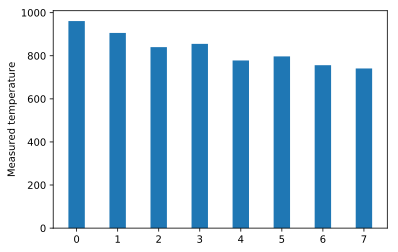

steel components:  {'C': 0.14, 'Si': 0.03, 'Mn': 0.4, 'P': 0.045, 'S': 0.035, 'Al': 0.05}
length of cool sections:  [0.8, 0.292, 1.177, 2.02, 1.545, 3.755, 4.002, 6.621, 8.729]
measured temperature:  {'location': array([ 0.9,  2. ,  3.1,  5.2,  7.8, 11.7, 16.8, 24.5]), 'value': array([961., 906., 840., 855., 778., 797., 756., 741.])}
heat transfer coefficients:  [[1100.  870.  750.  540.  400.  360.  280.  200.]]


In [3]:
components, coolsection_length, h_coolsection, measured_temperature = read_input_sourcedata()
plot_input_data()
print("steel components: ",components)
print("length of cool sections: ", coolsection_length)
print("measured temperature: ",measured_temperature)
print("heat transfer coefficients: ", h_coolsection.T)

# 数据预处理
预处理数据，得到连铸机二冷区各段开始和结束的位置 coolsection_start, coolsection_end

In [4]:
def pre_process_coolsection():
    length_temp = [sum(coolsection_length[0:i+1]) for i in range(len(coolsection_length))]
    coolsection_start, coolsection_end = length_temp[0:-1], length_temp[1:]
    return coolsection_start, coolsection_end

In [5]:
coolsection_start, coolsection_end = pre_process_coolsection()

# 传热模型求解

## 物性参数计算

### 固相温度 液相温度
根据钢的成分 计算固相温度和液相温度，计算物性参数 比热，密度，导热系数
${T_l} = 1536.6 - (88{w_C} + 8{w_{Si}} + 5{w_{Mn}} + 25{w_{Cu}} + 1.5{w_{Cr}}+ 4{w_{Ni}} + 2{w_{Mo}} + 18{w_{Ti}})\;\;\;\;\;\;$
${T_s} = 1527 - (187.5{w_C} + 700{w_S} + 500{w_P} + 20.5{w_{Si}}+ 11.5{w_{Ni}} + 6.5{w_{Mn}}+ 5.5{w_{Al}} + 2.0{w_{Cr}})\;\;\;\;\;\;$

### 凝固分数
计算凝固分数
${f_s} = \left\{ \begin{array}{l}
1\;,\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;T < {T_s}\\
\frac{{{T_l} - {T}}}{{{T_l} - {T_s}}},\;\;\;{T_s} \le T \le {T_l}\\
0,\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;{T_l} < T
\end{array} \right.$

### 比热，密度，导热系数 

${C_e}\left( T \right) = \left\{ \begin{array}{l}
{c_l}\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;T > {T_l},\\
{c_l} + \left( {{c_s} - {c_l}} \right){f_s} + \frac{L}{{{T_l} - {T_s}}}\;\;\;{T_s} \le T \le {T_l}\\
{c_s}\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;T < {T_s},
\end{array} \right.$

$k\left( T \right) = \left\{ \begin{array}{l}
{k_s},\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;T < {T_s}\\
{f_s}{k_s} + m\left( {1 - {f_s}} \right){k_l},\;\;\;{T_s} \le T \le {T_l}\\
{k_l},\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;{T_l} < T
\end{array} \right.$


In [6]:
def solid_liquid_temperature():
    temperature_l = 1536.6 - 88.0 * components["C"] - 8* components["Si"] - 5* components["Mn"]
    temperature_s = 1527.0 - 187.0 * components["C"] - 700.0* components["S"] - 500.0* components["P"] - 20.5 * components["Si"] - 6.5 * components["Mn"] - 5.5 * components["Al"]
    return temperature_l, temperature_s

def compute_fs(temperature_point, temperature_l, temperature_s):
    if(temperature_point >= temperature_l):
        fs = 0.0
    if(temperature_point > temperature_s and temperature_point < temperature_l):
        fs = (temperature_l - temperature_point) / (temperature_l - temperature_s)
    if(temperature_point <= temperature_s):
        fs = 1.0
    return fs
    
def physicial_parameters(temperature_point): 
    L = 268000.0
    temperature_l, temperature_s = solid_liquid_temperature()
    fs = compute_fs(temperature_point, temperature_l, temperature_s)
    if(temperature_point >= temperature_l):
        ce, k, pho = 540.0, 50.0, 7250
    if(temperature_point > temperature_s and temperature_point < temperature_l):
        ce, k ,pho = 540.0 + L / (temperature_l - temperature_s), fs*25 + (1-fs)*50, 7250
    if(temperature_point < temperature_s):
        ce, k, pho = 540.0, 28, 7250
    steel_para = {"ce":ce, "k":k, "pho":pho, "temperature_s":temperature_s, "temperature_l":temperature_l}
    return steel_para


In [7]:
print(solid_liquid_temperature())

(1522.04, 1450.33)


## 网格划分
初始化网格 nx空间网格数目 time_step 时间网格步长

In [8]:
def init_mesh(nx, time_step, time_simulation):
    mesh = {"nx":int(nx), "dx":0, "tnpts":0, "time_step":0.1}
    mesh["dx"] = continuous_caster["steel_length"] / (mesh["nx"] - 1)
    mesh["tnpts"] = int(time_simulation / mesh["time_step"])
    return mesh

In [9]:
continuous_caster = {"v_cast": 0.02, "continuous_caster_length": 28.9, "steel_length": 0.25, "temperature_cast":1558}
time_simulation = continuous_caster["continuous_caster_length"] / continuous_caster["v_cast"]
nx, time_step = int(25), 0.1
mesh = init_mesh(nx, time_step, time_simulation)
print(mesh)

{'nx': 25, 'dx': 0.010416666666666666, 'tnpts': 14450, 'time_step': 0.1}


## 初始条件
$T(x,0) = {T_{cast}}$

In [10]:
def init_condition():
    temperature_field = np.zeros((mesh["nx"], mesh["tnpts"]))
    temperature_field[:,0] = continuous_caster["temperature_cast"] * np.ones(temperature_field[:,0].shape)
    return temperature_field

temperature_field = init_condition()
print(temperature_field)

[[1558.    0.    0. ...    0.    0.    0.]
 [1558.    0.    0. ...    0.    0.    0.]
 [1558.    0.    0. ...    0.    0.    0.]
 ...
 [1558.    0.    0. ...    0.    0.    0.]
 [1558.    0.    0. ...    0.    0.    0.]
 [1558.    0.    0. ...    0.    0.    0.]]


## 有限差分求解传热模型
偏微分方程：
\begin{array}{l} \rho {c_e}\frac{{\partial T}}{{\partial t}} = \lambda \frac{{{\partial ^2}T}}{{\partial {x^2}}} \end{array}

显式差分 difference_1d_onestep 从t时间步 计算到t+1时间步
$\frac{{T_i^{n + 1} - T_i^n}}{{\Delta t}} = \frac{\lambda }{{\rho {c_e}}}\frac{{T_{i + 1}^n - 2T_i^n + T_{i - 1}^n}}{{\Delta {x^2}}}$

整理可得：
\begin{array}{l}
T_i^{n + 1} = \frac{{\lambda \Delta t}}{{\rho {c_e}\Delta {x^2}}}T_{i + 1}^n + \left( {1 - \frac{{2\lambda \Delta t}}{{\rho {c_e}\Delta {x^2}}}} \right)T_i^n + \frac{{\lambda \Delta t}}{{\rho {c_e}\Delta {x^2}}}T_{i - 1}^n
\end{array}

当$i=0$时
\begin{array}{l}
T_0^{n + 1} = \frac{{\lambda \Delta t}}{{\rho {c_e}\Delta {x^2}}}T_1^n + \left( {1 - \frac{{2\lambda \Delta t}}{{\rho {c_e}\Delta {x^2}}}} \right)T_0^n + \frac{{\lambda \Delta t}}{{\rho {c_e}\Delta {x^2}}}T_{ - 1}^n\\
\lambda \frac{{T_1^n - T_{ - 1}^n}}{{2\Delta x}} = h\left( {T_0^n - {T_w}} \right)
\end{array}

## 边界条件处理
带入边界条件可得迭代公式：
\begin{array}{l}
T_0^{n + 1} = \frac{{\lambda \Delta t}}{{\rho {c_e}\Delta {x^2}}}T_1^n + \left( {1 - \frac{{2\lambda \Delta t}}{{\rho {c_e}\Delta {x^2}}}} \right)T_0^n + \frac{{\lambda \Delta t}}{{\rho {c_e}\Delta {x^2}}}\left( {T_1^n - \frac{{2\Delta xh}}{\lambda }\left( {T_0^n - {T_w}} \right)} \right)
\end{array}

同理：
\begin{array}{l}
T_{nx}^{n + 1} = \frac{{\lambda \Delta t}}{{\rho {c_e}\Delta {x^2}}}\left( {T_{n - 1}^n - \frac{{2\Delta xh}}{\lambda }\left( {T_0^n - {T_w}} \right)} \right) + \left( {1 - \frac{{2\lambda \Delta t}}{{\rho {c_e}\Delta {x^2}}}} \right)T_{nx}^n + \frac{{\lambda \Delta t}}{{\rho {c_e}\Delta {x^2}}}T_{nx - 1}^n
\end{array}

solve_1d_model(h_coolsection) 多个时间步的计算

In [11]:
def difference_1d_onestep(current_tstep, h_coolsection):
    for i in range(mesh["nx"]):
        steel_para = physicial_parameters(temperature_field[i][current_tstep])
        a = steel_para['k'] * mesh["time_step"] / (steel_para['ce'] * steel_para['pho'] * mesh["dx"] * mesh["dx"])
        if not(i == 0) and not(i == (mesh["nx"]-1)):
            temperature_up, temperature_middle, temperature_down = temperature_field[i+1][current_tstep], temperature_field[i][current_tstep], temperature_field[i-1][current_tstep]
            temperature_field[i][current_tstep+1] = a *temperature_up + (1 - 2*a) * temperature_middle + a * temperature_down
        if i == 0:
            temperature_up, temperature_middle, temperature_down = boundary_condition(i, current_tstep, steel_para, h_coolsection)
            temperature_field[i][current_tstep+1] = a *temperature_up + (1 - 2*a) * temperature_middle + a * temperature_down
        if i == mesh["nx"]-1:
            temperature_up, temperature_middle, temperature_down = boundary_condition(i, current_tstep, steel_para, h_coolsection)
            temperature_field[i][current_tstep+1] = a *temperature_up + (1 - 2*a) * temperature_middle + a * temperature_down
    
def boundary_condition(i, current_tstep, steel_para, h_coolsection):
    temperature_water, h = 30.0, compute_h(current_tstep * mesh["time_step"] * continuous_caster["v_cast"], h_coolsection)
    if i == 0:
        temperature_up, temperature_middle = temperature_field[i+1][current_tstep], temperature_field[i][current_tstep]
        temperature_down = temperature_up - 2 * mesh["dx"] * h * (temperature_middle - temperature_water)/ (steel_para["k"])
    if i == mesh["nx"]-1:
        temperature_middle, temperature_down = temperature_field[i][current_tstep], temperature_field[i-1][current_tstep]
        temperature_up = temperature_down - 2 * mesh["dx"] * h * (temperature_middle - temperature_water)/ (steel_para["k"])
    return temperature_up, temperature_middle, temperature_down

def compute_h(y, h_coolsection):
    coolsection, h = len(coolsection_start), 0.0
    if y < coolsection_start[0]:
        h = 1400.0 + y * (800 - 1400) / coolsection_start[0]
        return h
    for i in range(coolsection):
        if y > coolsection_start[i] and y < coolsection_end[i]:
            h = h_coolsection[i]
    return h

def solve_1d_model(h_coolsection):
    for current_tstep in range(mesh["tnpts"] - 1):
        difference_1d_onestep(current_tstep, h_coolsection)

solve_1d_model(h_coolsection)
print(temperature_field)

[[1558.         1547.50890421 1537.34796534 ...  767.6244932
   767.60636159  767.588228  ]
 [1558.         1558.         1557.8765186  ...  821.13184104
   821.1122094   821.09257573]
 [1558.         1558.         1558.         ...  871.66075557
   871.63931578  871.61787414]
 ...
 [1558.         1558.         1558.         ...  871.66075557
   871.63931578  871.61787414]
 [1558.         1558.         1557.8765186  ...  821.13184104
   821.1122094   821.09257573]
 [1558.         1547.50890421 1537.34796534 ...  767.6244932
   767.60636159  767.588228  ]]


## 温度场可视化
画出铸坯表面温度和温度场云图，以检验计算结果是否正确
铸坯表面温度整体趋势会降低，在每个二冷区段交界处会产生一定的回温
铸坯温度云图 反应的是铸坯整个温度场的温度，中间温度高 两边温度低 呈对称

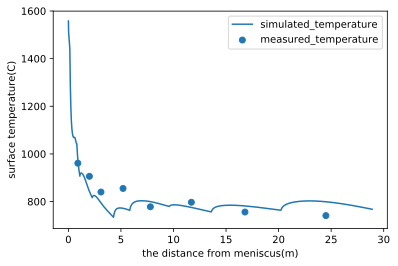

In [12]:
def plot_surface_temperature():
    x = continuous_caster["v_cast"] * time_step* (np.linspace(1,temperature_field.shape[1],temperature_field.shape[1]).astype(int))
    plt.plot(x, temperature_field[0,:], label = "simulated_temperature")
    plt.scatter(measured_temperature["location"], measured_temperature["value"], label = "measured_temperature")
    plt.xlabel("the distance from meniscus(m)")
    plt.ylabel("surface temperature(C)")
    plt.legend()
    plt.show()
    
def plot_temperature_field():    
    x, y =  np.meshgrid(mesh["time_step"] * continuous_caster["v_cast"] * np.arange(temperature_field.shape[1]), mesh["dx"] * np.arange(mesh["nx"]))
    plt.contourf(x,y,temperature_field)
    plt.xlabel("the distance from meniscus(m)")
    plt.ylabel("the thickness of slab")
    plt.colorbar()
    plt.show()
    
plot_surface_temperature()
plot_temperature_field()

在计算出温度场以后 需要找出对应 measured_location 的 计算温度值

In [13]:
def compute_simulated_temperature(temperature_field, measured_temperature):
    measured_time_step = ((measured_temperature["location"] / continuous_caster["v_cast"])/ mesh["time_step"]).astype(int)
    simulated_temperature = temperature_field[0, measured_time_step].copy()
    #simulated_temperature = simulated_temperature.reshape(simulated_temperature.shape[0],1)
    return simulated_temperature
simulated_temperature = compute_simulated_temperature(temperature_field, measured_temperature)
print(simulated_temperature)

[975.2337577  842.44006558 794.39519642 771.67020298 799.74323187
 775.29896042 781.54839761 799.15812043]


# 优化算法
## 目标函数计算
计算目标函数值 此处我们取最小二乘形式
\begin{array}{l}
J = \frac{1}{N}\sum\limits_{i = 1}^N {{{\left( {T_m^i - T_c^i} \right)}^2}} 
\end{array}

其中$T_m^i$ 为测量温度， $T_c^i$ 为计算温度， N为测量的点数目

In [14]:
def compute_cost(simulated_temperature):
    return ((simulated_temperature - measured_temperature["value"])**2).sum() / simulated_temperature.size
f_cost = compute_cost(simulated_temperature)
print(f_cost)

2280.6136432168178


## 目标函数梯度计算
计算Jacobian矩阵和梯度，Jacobian的计算是反问题算法的核心内容也是不容易理解的地方,为了表达简洁明了一律采用向量的形式进行表达
$h \in {R^{Nz}},{T_c} \in {R^N},{T_m} \in {R^N}$
其中
\begin{array}{l}
h{\rm{ = }}\left[ {{h_1},{h_2}, \cdots {h_{Nz}}} \right],{T_c} = \left[ {T_c^1,T_c^2, \cdots T_c^N} \right],{T_m} = \left[ {T_m^1,T_m^2, \cdots T_m^N} \right]
\end{array}

对目标函数求导数，根据链式法则有
\begin{array}{l}
\frac{{\partial J}}{{\partial h}} = \frac{{\partial J}}{{\partial {T_c}}}\frac{{\partial {T_c}}}{{\partial h}}
\end{array}

易知
$\frac{{\partial J}}{{\partial {T_c}}}{\rm{ = }}\frac{2}{N}\left( {{T_c} - {T_m}} \right)$

$\frac{{\partial {T_c}}}{{\partial h}}$ 就是Jacobian矩阵，其具体的形式为
\begin{array}{l}
\frac{{\partial {T_c}}}{{\partial h}}{\rm{ = }}\left[ {\begin{array}{*{20}{c}}
{\frac{{\partial T_c^1}}{{\partial {h_1}}}}&{\frac{{\partial T_c^1}}{{\partial {h_2}}}}& \cdots &{\frac{{\partial T_c^1}}{{\partial {h_N}}}}\\
{\frac{{\partial T_c^2}}{{\partial {h_1}}}}& \ddots &{}& \vdots \\
 \vdots &{}&{}&{}\\
{\frac{{\partial T_c^N}}{{\partial {h_1}}}}& \cdots &{}&{\frac{{\partial T_c^1}}{{\partial {h_1}}}}
\end{array}} \right]
\end{array}

雅克比矩阵的每一个元素要通过如下的数值导数方法进行计算
\begin{array}{l}
\frac{{\partial T_c^1}}{{\partial {h_1}}} \approx \frac{{T_c^1\left( {h + \varepsilon {e_1}} \right) - T_c^1\left( h \right)}}{\varepsilon }\
\end{array}
其中$e_i\in R^N$ 为第i个分量为1，其它分量为0的向量

所以整个梯度的表达式为
\begin{array}{l}
\frac{{\partial J}}{{\partial h}}{\rm{ = }}\frac{2}{N}{\left[ {\begin{array}{*{20}{c}}
{T_c^1 - T_m^1}\\
{T_c^2 - T_m^2}\\
 \vdots \\
{T_c^N - T_m^N}
\end{array}} \right]^T}\left[ {\begin{array}{*{20}{c}}
{\frac{{\partial T_c^1}}{{\partial {h_1}}}}&{\frac{{\partial T_c^1}}{{\partial {h_2}}}}& \cdots &{\frac{{\partial T_c^1}}{{\partial {h_N}}}}\\
{\frac{{\partial T_c^2}}{{\partial {h_1}}}}& \ddots &{}& \vdots \\
 \vdots &{}&{}&{}\\
{\frac{{\partial T_c^N}}{{\partial {h_1}}}}& \cdots &{}&{\frac{{\partial T_c^1}}{{\partial {h_1}}}}
\end{array}} \right]
\end{array}

In [15]:
def init_h_delta(h_coolsection, kesai):
    h_delta = np.zeros((h_coolsection.shape[0], h_coolsection.shape[0]))
    h_delta = h_coolsection + kesai * np.eye(h_coolsection.shape[0])
    return h_delta

def compute_gradients(kesai, h_coolsection):
    h_delta = init_h_delta(h_coolsection, kesai)
    temperature_delta = np.zeros((h_delta.shape))
    
    for index in range(h_delta.shape[1]):
        init_condition()
        solve_1d_model(h_delta[:,index])
        temperature_delta[:,index] = compute_simulated_temperature(temperature_field, measured_temperature)

    Jacobian = (temperature_delta - simulated_temperature.reshape(simulated_temperature.shape[0], 1))/ kesai
    gradients = 2 * np.dot((simulated_temperature - measured_temperature["value"]), Jacobian) / simulated_temperature.size     
    return gradients, Jacobian

kesai = 0.1
gradients, Jacobian = compute_gradients(kesai, h_coolsection)
print(Jacobian)
print(gradients)

[[-1.58525269e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-2.38660059e-02 -3.92062204e-01  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-7.77923458e-03 -1.02084453e-01 -3.75072251e-01  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-2.62727547e-03 -2.80786561e-02 -1.68675783e-01 -4.04252412e-01
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-1.38444936e-03 -1.26252481e-02 -6.30144539e-02 -1.18067229e-01
  -6.07010721e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-7.78508085e-04 -5.91364280e-03 -2.55866148e-02 -4.37362946e-02
  -2.52899805e-01 -6.24058022e-01  0.00000000e+00  0.00000000e+00]
 [-5.40374747e-04 -3.42631476e-03 -1.25126018e-02 -2.03288578e-02
  -1.05243842e-01 -2.37647953e-01 -7.80655634e-01  0.00000000e+00]
 [-4.03524415e-04 -2.21666255e-03 -6.74752214e-03 -1.03818926e-02
  -

## 搜索方向计算
得到梯度之后 可以根据梯度来计算迭代方向
这里采用的是LM算法迭代公式如下所示：
\begin{array}{l}
{d_k} =  - {\left( {J_k^T{J_k} + {\lambda _k}I} \right)^{ - 1}}J_k^T\left( {{T_c} - {T_m}} \right)
\end{array}

其中${{J_k}}$ 表示第k步迭代的Jacobian矩阵，$\lambda _k$ 为第k步迭代的常数，$I$ 是单位矩阵

In [16]:
def compute_search_direction_lm(Jacobian,temperature_simulated):
    lamb = 1
    dk = -np.dot(np.mat(np.dot(Jacobian.T, Jacobian) + lamb * np.eye(Jacobian.shape[1])).I, np.dot(Jacobian.T, (temperature_simulated - measured_temperature["value"])))
    return dk
dk = compute_search_direction_lm(Jacobian,simulated_temperature)
print(dk)

[[  0.55433326 -26.08251557 -23.23559416 -25.5289204   10.26038841
   -6.01688465  18.97754784  25.95674923]]


## 更新换热系数
更新h,LM算法没有步长，所以这里无需步长
$h_{k+1} = h_k + d_k$

In [17]:
def update_h(h_coolsection, dk):
    h_coolsection = h_coolsection + dk.T
    return h_coolsection
h_coolsection = update_h(h_coolsection, dk)
print(h_coolsection.T)

[[1100.55433326  843.91748443  726.76440584  514.4710796   410.26038841
   353.98311535  298.97754784  225.95674923]]


## KED方法计算权值
残差计算公式：
${\varepsilon _i} = T_c^i - T_m^i,\;\;\;\;i = 1,2, \cdots ,n$

根据残差可以得到目标函数的权值，权值计算公式：
\begin{array}{l}
f\left( x \right) = \frac{1}{{Dn}}\sum\limits_{j = 1}^n {\phi \left( {\frac{{x - {\varepsilon _j}}}{D}} \right)} \\
\phi \left( x \right) = \frac{1}{{\sqrt {2\pi } }}{e^{ - \frac{1}{2}{x^2}}}
\end{array}

其中 $D = 1.06\sigma {n^{ - 0.2}}$ 

$\sigma$为方差，n为测量数据个数

In [18]:
def compute_weight(simulated_temperature, measured_temperature):
    residual = simulated_temperature - measured_temperature['value']
    sigma = np.var(residual)
    D = 1.06 * sigma * residual.size**(-0.2)
    weight, f = [], 0.0
    for i in range(residual.size):
        f = 0.0
        for j in range(residual.size):
            f += (1.0 / (D * residual.size * (2*np.pi)**0.5)) * np.exp(-0.5*(residual[i] - residual[j])/ D)
        weight.append(f)
    return weight

## 输出优化结果
到此为止 仅仅是完成了从第k步到k+1步的一次迭代，把这个过程不停的进行就构成了整个反问题的迭代算法
max_iter_times 为最大的迭代次数
save_result_per_iteration 把每一次迭代的目标函数和梯度的范数保存下来，最终要对这些结果进行分析。

In [19]:
def save_result_per_iteration(f_cost, gradients, cost_per_iter, gradients_norm_per_iter):
    gradients_norm_per_iter.append(np.linalg.norm(gradients,ord = 2))
    cost_per_iter.append(f_cost)
    return cost_per_iter, gradients_norm_per_iter

# 算法主流程

In [ ]:
start_time = time.clock()
components, coolsection_length, h_coolsection, measured_temperature = read_input_sourcedata()
coolsection_start, coolsection_end = pre_process_coolsection()
continuous_caster = {"v_cast": 0.02, "continuous_caster_length": 28.9, "steel_length": 0.25, "temperature_cast":1558}
time_simulation = continuous_caster["continuous_caster_length"] / continuous_caster["v_cast"]
nx, time_step = int(25), 0.1
mesh = init_mesh(nx, time_step, time_simulation)

max_iter_times = 50
cost_per_iter, gradients_norm_per_iter = [], []

for iter_times in range(max_iter_times):
    temperature_field = init_condition()
    solve_1d_model(h_coolsection)
    simulated_temperature = compute_simulated_temperature(temperature_field, measured_temperature)
    f_cost = compute_cost(simulated_temperature)
    print("iteration times:", iter_times, "  cost function:", f_cost)
    kesai = 0.1
    gradients, Jacobian = compute_gradients(kesai, h_coolsection)
    dk = compute_search_direction_lm(Jacobian, simulated_temperature)
    h_coolsection = update_h(h_coolsection, dk)   
    cost_per_iter, gradients_norm_per_iter = save_result_per_iteration(f_cost, gradients, cost_per_iter, gradients_norm_per_iter)

print("running time is ", time.clock() - start_time)

iteration times: 0   cost function: 2280.6136432168178
iteration times: 1   cost function: 1308.3050369882026


In [ ]:
weight = compute_weight(simulated_temperature, measured_temperature)
print(weight)

最终结果的分析和画图，主要涉及两个内容 1目标函数随着迭代次数的变化情况，2测量温度和计算温度的吻合情况

In [ ]:
def plot_result():
    plt.figure(1)
    plt.plot(cost_per_iter)
    plt.xlabel("iteration times")
    plt.ylabel("cost function")    

In [ ]:
plot_surface_temperature()
plot_temperature_field()
plot_result()